# CNN: CELEBRITY FACE CLASSIFIER

#Inicialización de bibliotecas y definición de funciones: 
Los procedimientos que se ejecutan muchas veces fueron encapsulados en funciones. Acá se encuentran las siguientes funciones:
- **plots** Muestra las imágenes desde una lista obtenida de un generador.
- **plot_model** Gráfico del entrenamiento de un modelo. Exactitud respecto a las épocas.
- **generar_AlexNet_original** Crea una secuencia con el modelo de la red AlexNet Original. Se debe modificar en la llamada.
- **convert_generador_to_label_list** Devuelve una lista con las etiquetas del generador
- **convert_generador_to_label_image_list** Devuelve una tupla con la lista de imagenes y etiquetas de un generador.
- **Mostrar10ClasificacionesMalas** Muestra 10 imagenes de una clase mal clasificadas en la última parte de la tarea, con sus etiquetas reales y predichas.
- **Mostrar10ClasificacionesBuenas** Muestra 10 imagenes de una clase bien clasificadas en la última parte de la tarea, con sus etiquetas reales y predichas.

In [0]:
#@title Inicialización
!pip install -q prettytable
from keras import backend as K
import scipy.io as sio
from keras import Sequential
from keras.layers.core import Dense, Activation, Dropout,Flatten
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D, Convolution2D, BatchNormalization
import keras
from keras import optimizers
from google.colab import files
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import os
import matplotlib.pyplot as plt 
%matplotlib inline
import numpy as np
import time
from sklearn import svm 
from sklearn import metrics
import numpy as np
import seaborn as sns
from sklearn.metrics import accuracy_score
from IPython.display import Image
from keras.applications.vgg16 import VGG16
from prettytable import PrettyTable

# chequeamos que funcione GPU 
K.tensorflow_backend._get_available_gpus()

# grafica imagenes 
def plots(ims, figsize=(200,100), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=10)
        plt.imshow(ims[i], interpolation=None if interp else 'none')
        

def plot_model(model_details):

    # Create sub-plots
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    
    # Summarize history for accuracy
    axs[0].plot(range(1,len(model_details.history['acc'])+1),model_details.history['acc'])
    axs[0].plot(range(1,len(model_details.history['val_acc'])+1),model_details.history['val_acc'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1,len(model_details.history['acc'])+1),len(model_details.history['acc'])/10)
    axs[0].legend(['train', 'val'], loc='best')
    
    # Summarize history for loss
    axs[1].plot(range(1,len(model_details.history['loss'])+1),model_details.history['loss'])
    axs[1].plot(range(1,len(model_details.history['val_loss'])+1),model_details.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1,len(model_details.history['loss'])+1),len(model_details.history['loss'])/10)
    axs[1].legend(['train', 'val'], loc='best')
    
    # Show the plot
    plt.show()
    
#@title Generar modelo alexnet original (Devuelve secuencia)
def generar_AlexNet_original():
  import keras
  man = Sequential()
  man.add(ZeroPadding2D((2,2),input_shape=(224, 224, 3)))
  man.add(Convolution2D(96,(11,11), strides=(4,4), padding='valid'))
  man.add(Activation(activation='relu'))
  man.add(BatchNormalization())
  man.add(MaxPooling2D((3,3), strides=(2,2)))
  man.add(ZeroPadding2D((2,2)))
  man.add(Convolution2D(256, (5, 5), padding='valid'))
  man.add(Activation(activation='relu'))
  man.add(BatchNormalization())
  man.add(MaxPooling2D((3,3), strides=(2,2)))
  man.add(ZeroPadding2D((1,1)))
  man.add(Convolution2D(384, (3, 3), padding='valid'))
  man.add(Activation(activation='relu'))
  man.add(ZeroPadding2D((1,1)))
  man.add(Convolution2D(384, (3, 3), padding='valid'))
  man.add(Activation(activation='relu'))
  man.add(ZeroPadding2D((1,1)))
  man.add(Convolution2D(256, (3, 3), padding='valid'))
  man.add(MaxPooling2D((3,3), strides=(2,2)))
  man.add(Activation(activation='relu'))
  man.add(Flatten())
  man.add(Dense(4096,activation='relu'))
  man.add(Dropout(0.5))
  man.add(Dense(4096,activation='relu'))
  man.add(Dropout(0.5))
  man.add(Dense(1000,activation='softmax')) #esta se le saca en el codigo
  #man.man.summary()
  return man


#@title Función que convierte un generador de ImageDataGenerator en lista de etiquetas (Devuelve lista)
def convert_generador_to_label_list(generador, total):
  contador = 0
  labels = list()
  for item in generador:
    i,l = item
    labels = labels + list(np.argmax(l, axis=-1))
    contador = contador + 32 # 32 es el batch size
    if contador >= total:
      return labels

#@title Función que convierte un generador de ImageDataGenerator en lista de imagenes y etiquetas (Devuelve tupla de listas)
def convert_generador_to_label_image_list(generador, total):
  contador = 0
  labels = list()
  images = list()
  for item in generador:
    i,l = item
    labels = labels + list(np.argmax(l, axis=-1))
    images = images + list(i);
    contador = contador + 32 # 32 es el batch size
    if contador >= total:
      return images,labels

#@title Función que muestra las 10 imagens mal clasificadas de una clase
def Mostrar10ClasificacionesMalas(clase):
  f = plt.figure(figsize=(30,30))
  posi = 1
  cont = 0
  for num in range(len(labels_reales)):
    if labels_reales[num] == clase :
      if labels_reales[num] != labels_predict[num]:
        #print(num)
        sp = f.add_subplot(15,10,posi)
        sp.axis('Off')
        label = "Real: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_reales[num])])+"\nPredict: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_predict[num])])
        sp.set_title(label,fontsize=9)
        posi = posi+1
        plt.imshow(real_i[num]/255)
        cont = cont + 1
        if cont >= 10:
          return

# Muestra la foto de 10 clasificaciones malas y hace un ranking con las clases de mayor similitud
def Mostrar10ClasificacionesMalasProbabilidad(clase):
  f = plt.figure(figsize=(30,30))
  posi = 1
  cont = 0
  for num in range(len(labels_reales)):
    if labels_reales[num] == clase :
      if labels_reales[num] != labels_predict[num]:
        #print(num)
        sp = f.add_subplot(15,10,posi)
        sp.axis('Off')
        label = "Real: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_reales[num])])+"\nPredict: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_predict[num])])
        sp.set_title(label,fontsize=9)
        
        ranking = (-prediccion[num]).argsort()
        textplot = ""
        cont_rank=1
        for rank in ranking[0:5]:
          if rank == labels_reales[num]:
            textplot = textplot + "\n*" + str(cont_rank) + ". " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index( rank ) ]) + " (" + str(round(prediccion[num][rank],3)) + " )"
          else:
            textplot = textplot + "\n" + str(cont_rank) + ". " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index( rank ) ]) + " (" + str(round(prediccion[num][rank],3)) + " )"            
          cont_rank = cont_rank + 1 
        
        plt.text(0, 429, textplot, verticalalignment="bottom", horizontalalignment='left')
        posi = posi+1
        plt.imshow(real_i[num]/255)
        cont = cont + 1
        if cont >= 10:
          return
        
      
        
#@title Función que muestra las 10 imagens bien clasificadas de una clase   
def Mostrar10ClasificacionesBuenas(clase):
  f = plt.figure(figsize=(30,30))
  posi = 1
  cont = 0
  for num in range(len(labels_reales)):
    if labels_reales[num] == clase :
      if labels_reales[num] == labels_predict[num]:
        #print(num)
        sp = f.add_subplot(15,10,posi)
        sp.axis('Off')
        label = "Real: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_reales[num])])+"\nPredict: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_predict[num])])
        sp.set_title(label,fontsize=9)
        posi = posi+1
        plt.imshow(real_i[num]/255)
        cont = cont + 1
        if cont >= 10:
          return
        
# Muestra la foto de 10 clasificaciones BUENAS y hace un ranking con las clases de mayor similitud
def Mostrar10ClasificacionesBuenasProbabilidad(clase):
  f = plt.figure(figsize=(30,30))
  posi = 1
  cont = 0
  for num in range(len(labels_reales)):
    if labels_reales[num] == clase :
      if labels_reales[num] == labels_predict[num]:
        #print(num)
        sp = f.add_subplot(15,10,posi)
        sp.axis('Off')
        label = "Real: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_reales[num])])+"\nPredict: " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(labels_predict[num])])
        sp.set_title(label,fontsize=9)
        
        ranking = (-prediccion[num]).argsort()
        textplot = ""
        cont_rank=1
        for rank in ranking[0:5]:
          if rank == labels_reales[num]:
            textplot = textplot + "\n*" + str(cont_rank) + ". " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index( rank ) ]) + " (" + str(round(prediccion[num][rank],3)) + " )"
          else:
            textplot = textplot + "\n" + str(cont_rank) + ". " + (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index( rank ) ]) + " (" + str(round(prediccion[num][rank],3)) + " )"            
          cont_rank = cont_rank + 1 
        
        plt.text(0, 429, textplot, verticalalignment="bottom", horizontalalignment='left')
        posi = posi+1
        plt.imshow(real_i[num]/255)
        cont = cont + 1
        if cont >= 10:
          return
        

AlexNet segunda capa

In [4]:
modelAlexNet = Sequential()
modelAlexNet.add(ZeroPadding2D((2,2),input_shape=(224, 224, 3)))

# 96 filtros de 11x11
modelAlexNet.add(Convolution2D(96,(11,11), strides=(4,4), padding='valid'))

modelAlexNet.add(Activation(activation='relu'))
modelAlexNet.add(BatchNormalization())

print('antes de maxpooling:')
print(modelAlexNet.output_shape)
modelAlexNet.add(MaxPooling2D((3,3), strides=(2,2)))

print('\ndespues de maxpooling:')
print(modelAlexNet.output_shape)

modelAlexNet.summary()

#segunda capa
modelAlexNet.add(ZeroPadding2D((2,2)))
modelAlexNet.add(Convolution2D(256, (5, 5), padding='valid'))
modelAlexNet.add(Activation(activation='relu'))
modelAlexNet.add(BatchNormalization())
modelAlexNet.add(MaxPooling2D((3,3), strides=(2,2)))

print('\ndimensiones de segunda capa:')
print(modelAlexNet.output_shape)

modelAlexNet.summary()

# (11*11*3(RGB)+1)*396 (pixel1*pixel2*RGB+BIAS)*MAPAS ACTIVACION SIGUIENTE CAPA 
print('primera capa ')

# 5x5 pixeles x 96 mapas de activacion + bias(=1) y todo multiplicado por el total de filtros 256
print('El total de parametros de la segunda capa: {}'.format((5*5*96 +1)*256))


antes de maxpooling:
(None, 55, 55, 96)

despues de maxpooling:
(None, 27, 27, 96)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
Total params: 35,328
Trainable params: 35,136
Non-trainable params: 192
_________________________________________________________________

dimensiones de segunda capa:
(None, 13, 13, 256)
___

Esta red hasta el momento tiene 614.656 parametros correspondiente a 5x5 pixeles x 96 mapas de activacion mas bias. Todo multiplicado por el total de filtros (256)

padding 1 <br> 
no utiliza batch normalization <br>
no tiene maxpooling 

In [5]:
# tercera capa
modelAlexNet.add(ZeroPadding2D((1,1)))
modelAlexNet.add(Convolution2D(384, (3, 3), padding='valid'))
modelAlexNet.add(Activation(activation='relu'))
modelAlexNet.summary()
print("Parametros tercera: ",format(((3*3*256)+1) * 384))
print(modelAlexNet.output_shape)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
__________

Capas 4 y 5 
En capa 4 hay padding 1 a 0 <br>
En capa 5 tiene padding no incopora batch, max pooling de 3x3 y un stride 2 (horizontal y vertical)


In [6]:
# cuarta capa
modelAlexNet.add(ZeroPadding2D((1,1)))
modelAlexNet.add(Convolution2D(384, (3, 3), padding='valid'))
modelAlexNet.add(Activation(activation='relu'))
modelAlexNet.summary()
print("Parametros cuarta: ",format(((3*3*384)+1) * 384))
print(modelAlexNet.output_shape)

# quinta capa
modelAlexNet.add(ZeroPadding2D((1,1)))
modelAlexNet.add(Convolution2D(256, (3, 3), padding='valid'))
modelAlexNet.add(MaxPooling2D((3,3), strides=(2,2)))
modelAlexNet.add(Activation(activation='relu'))
modelAlexNet.summary()
print("Parametros quinta capa: ",format(((3*3*384)+1) * 256))
print(modelAlexNet.output_shape)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
__________

- Hasta el momento la red tiene 3.748.608 parámetros.
- La ultima capa tiene 884.992 parámetros. 

In [7]:
# Capa sexta 
modelAlexNet.add(Flatten())
print(modelAlexNet.output_shape)

(None, 9216)


- Con flatten se aplanan los parametros a una dimensión 
- La dimensiones no son como se esperaba porque falta el drop out en el siguiente paso, deberian ser 4096. 


In [6]:
# Capa 6
modelAlexNet.add(Dense(4096,activation='relu'))
modelAlexNet.add(Dropout(0.5))
modelAlexNet.summary()
print(modelAlexNet.output_shape)
print("la capa tiene parametros: ", format(((256*6*6+1)*4096)))


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
__________

- Podemos observar que hasta el momento la red tiene 37.752.832 parametros luego del drop out. 
- Correspondiente a (256x6x6+1)x4096

In [7]:
#capa 7
modelAlexNet.add(Dense(4096,activation='relu'))
modelAlexNet.add(Dropout(0.5))
modelAlexNet.summary()
print(modelAlexNet.output_shape)

#capa 8
modelAlexNet.add(Dense(1000,activation='softmax'))
modelAlexNet.summary()
print(modelAlexNet.output_shape)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
__________

- La capa que tiene mas parámetros es la sexta capa con 37.752.832 parametros. 
- Los parametros se van acumulando capa a capa
- Las capas finales tienen más parametros porque tienen que detectar mejor patrones en las etapas finales previas a la clasificación. 

Correr todas las capas de AlexNet (original, con 1000 clases) encapsulado en una función.

In [9]:
modelAlexNet = generar_AlexNet_original()
modelAlexNet.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_11 (ZeroPaddi (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_11 (Activation)   (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_12 (ZeroPaddi (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 27, 27, 256)       614656    
__________

- El total de parametros de la red son 62.379.752 
- Antes del drop out habian 16.781.312 parametros luego se achica a 4.097.000 

Se utilizaron los features obtenidos a través de la red AlexNet entregados y de realizó la clasificación con SVM, obteniendo los siguientes resultados: 


**Para obtener el dataset MIT-10-Classes.zip: **

In [2]:
!wget 'https://www.dropbox.com/s/c0d7npcg1yysnux/MIT-10-Classes.zip?dl=0'
#!ls MIT-10-Classes/Feats/TrainSet
!unzip 'MIT-10-Classes.zip*'

--2018-05-02 02:07:53--  https://www.dropbox.com/s/c0d7npcg1yysnux/MIT-10-Classes.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.1, 2620:100:601f:1::a27d:901
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dl.dropboxusercontent.com/content_link/nebP9arw0N9Lc25VD0eqkQSyJXaNUsIVY5SfWxizFmLaqU29Pd8zyqmNHYp62VfE/file [following]
--2018-05-02 02:07:53--  https://dl.dropboxusercontent.com/content_link/nebP9arw0N9Lc25VD0eqkQSyJXaNUsIVY5SfWxizFmLaqU29Pd8zyqmNHYp62VfE/file
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.9.6, 2620:100:601f:6::a27d:906
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.9.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 139459806 (133M) [application/zip]
Saving to: ‘MIT-10-Classes.zip?dl=0’

MIT-10-Classes.zip? 100%[===================>] 133.00M  36.7MB/s    in 3.6s    


  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_85_06_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_83_22_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_775384.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_76_14_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_63_16_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_59_17_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_57_22_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_51_16_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_50_20_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_48_07_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_43_24_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantry_43_23_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/pantry/pantr

  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_08_21_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_08_16_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_08_08_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_07_08_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_05_17_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_05_13_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_05_11_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_05_07_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_05_01_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_04_03_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_03_18_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TrainSetImgs/florist/floreria_02_13_flickr.jpg  
  inflating: MIT

  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/cave_champagne_08_06_altavista.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/cave.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/bodega_123_16_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/bodega_11_23_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/bodega_119_18_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/bodega_114_20_flickr.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/winecellar/Wine_cellar.jpg  
   creating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/
  inflating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/studio_overall.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/studio2.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/sala6.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/pic2.jpg  
  inflating: MIT-10-Classes/Imgs/TestSetImgs/studiomusic/music_studio12.jpg  
  inflating: 

  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/Estudio_Musica_1.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/DSCN3237M.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/DCOM_Music_lg_nws_2164_5043.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/ControlRoomSm.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/Beach_Studio.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/BB_Studio_1_Mar2005_800.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/851_bandroom.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/82793611.oGmwNa9a.20070629studio01comp.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/6176_2.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/60984.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/4683183.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/studiomusic/364906b0.fc6.mat  
  inflating: MIT-10-Classes/Feat

  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0177.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0176.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0175.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0171.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0170.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0166.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0158.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0157.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0152.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0151.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0149.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0145.fc6.mat  
  inflating: MIT-10-Classes/Feats/TrainSet/bowling/bowling_0143.fc6.mat  
  inflating: MIT-10-Classes/Feats/Trai

In [15]:
# obtener lista de features 
import scipy.io as sio
import os

classes = os.listdir('MIT-10-Classes/Feats/TrainSet')

# training feats 
training_feats = []
y_train_imgs = []

test_feats = []
y_test_imgs = []

label_train = []
label_test = []


cont = 0 

# train feats list of vectors 
for x in classes:
  for y in os.listdir('MIT-10-Classes/Feats/TrainSet/{}'.format(x)):
    training_feats.append(x+"/"+y)
    y_train_imgs.append(cont)
    label_train.append(x);
  cont +=1
  
cont = 0
# test feats list of vectors 
for x_ in classes:
  for y_ in os.listdir('MIT-10-Classes/Feats/TestSet/{}'.format(x_)):
    test_feats.append(x_+"/"+y_)
    y_test_imgs.append(cont)
    label_test.append(x_);
  cont +=1

set_label_train = os.listdir('MIT-10-Classes/Feats/TrainSet/')
set_label_test  = os.listdir('MIT-10-Classes/Feats/TestSet/')
  
print('cantidad de vectores de features training: {}'.format(len(training_feats)))
print('cantidad de vectores de features testing: {}'.format(len(test_feats)))
print('cantidad de labels de features training: {}'.format(len(y_train_imgs)))
print('cantidad de labels de features testing: {}'.format(len(y_test_imgs)))
print('OK...')


print(set_label_test)
print(set_label_train)


cantidad de vectores de features training: 799
cantidad de vectores de features testing: 201
cantidad de labels de features training: 799
cantidad de labels de features testing: 201
OK...
['laundromat', 'studiomusic', 'cloister', 'greenhouse', 'concert_hall', 'winecellar', 'bowling', 'florist', 'gameroom', 'pantry']
['laundromat', 'studiomusic', 'cloister', 'greenhouse', 'concert_hall', 'winecellar', 'bowling', 'florist', 'gameroom', 'pantry']


### El procedimiento para obtener la exactitud y la clasificación se detalla a continuación: 

Cada vector tiene 4096 features
Train: (imagenes, feats) (799, 4096)
Test : (imagene, feats) (201, 4096)
Train label:  (799,)
Test label:  (201,)
*** La clasificacion con SVM (transfer learning) tiene un 95.02487562189054% de exactitud sobre el set de test
*** La clasificacion con SVM (transfer learning) tiene un 100.0% de exactitud sobre el set de train

Reporte de clasificación
              precision    recall  f1-score   support

concert_hall       0.91      1.00      0.95        20
 studiomusic       1.00      1.00      1.00        20
      pantry       1.00      0.95      0.97        20
    cloister       0.86      1.00      0.93        19
  greenhouse       1.00      0.90      0.95        20
    gameroom       1.00      0.95      0.97        20
  winecellar       1.00      0.82      0.90        22
  laundromat       0.95      0.90      0.92        20
     bowling       0.95      1.00      0.97        19
     florist       0.88      1.00      0.93        21

 avg / total       0.

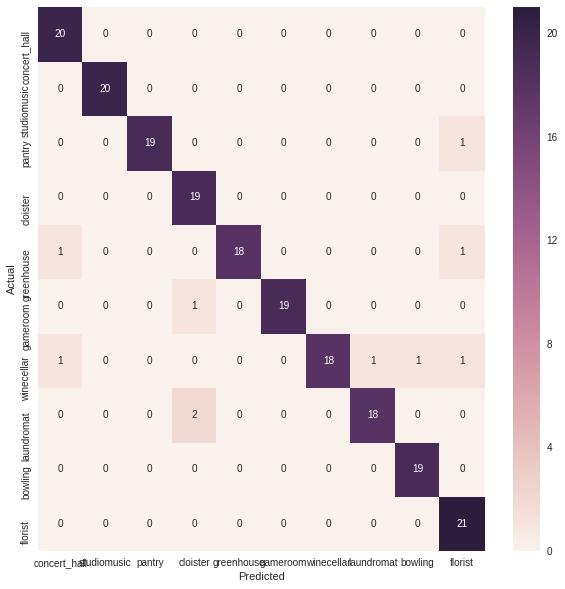

El accuracy por cada clase, de menor a mayor
+----+--------------+----------+
| No |    Clase     | Accuracy |
+----+--------------+----------+
| 6  |  winecellar  |  81.82   |
| 4  |  greenhouse  |   90.0   |
| 7  |  laundromat  |   90.0   |
| 2  |    pantry    |   95.0   |
| 5  |   gameroom   |   95.0   |
| 0  | concert_hall |  100.0   |
| 1  | studiomusic  |  100.0   |
| 3  |   cloister   |  100.0   |
| 8  |   bowling    |  100.0   |
| 9  |   florist    |  100.0   |
+----+--------------+----------+


In [18]:
# entregamos features a SVM para entrenar modelo
# Se utiliza SVM mutliclase http://scikit-learn.org/stable/modules/svm.html

from sklearn import svm 
from sklearn import metrics
from sklearn.metrics import accuracy_score
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Armar matriz de vectores con features
mat = sio.loadmat('MIT-10-Classes/Feats/TrainSet/'+training_feats[0])
print('Cada vector tiene {} features'.format(mat['stored'].size))

feat_train_matrix = np.empty(4096) #4096 es el numero de features (de acuerdo a la capa de alexnet)
for train_ in training_feats :
  mat = sio.loadmat('MIT-10-Classes/Feats/TrainSet/'+train_)
  feat_train_matrix = np.vstack([feat_train_matrix, mat['stored']])
#print("Training: (imagenes, feats)",np.shape(feat_train_matrix))
feat_train_matrix = np.delete(feat_train_matrix, (0) , axis=0)

feat_test_matrix = np.empty(4096)
for test_ in test_feats :
  mat = sio.loadmat('MIT-10-Classes/Feats/TestSet/'+test_)
  feat_test_matrix = np.vstack([feat_test_matrix, mat['stored']])
feat_test_matrix = np.delete(feat_test_matrix, (0) , axis=0)

print("Train: (imagenes, feats)",np.shape(feat_train_matrix))
print("Test : (imagene, feats)",np.shape(feat_test_matrix))
print("Train label: ",np.shape(y_train_imgs))
print("Test label: ",np.shape(y_test_imgs))

#SVM
clf = svm.SVC(gamma=0.001, C=1000., kernel='linear')
clf.fit(feat_train_matrix, label_train) 

dec = clf.decision_function(feat_train_matrix)
pred = clf.predict(feat_test_matrix)

accuracy = accuracy_score(pred, label_test)

print ("*** La clasificacion con SVM (transfer learning) tiene un {}% de exactitud sobre el set de test". format(accuracy*100))
print ("*** La clasificacion con SVM (transfer learning) tiene un {}% de exactitud sobre el set de train". format(( accuracy_score(clf.predict(feat_train_matrix),label_train) )*100))

print ("\nReporte de clasificación")
print(metrics.classification_report(label_test, pred, target_names=set_label_test ))


conf_mat = metrics.confusion_matrix(label_test, pred)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(conf_mat, annot=True, fmt='d',
            xticklabels=set_label_test, yticklabels=set_label_test)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()


accuracy_per_class = conf_mat.diagonal()/conf_mat.sum(axis=1)

t = PrettyTable(['No', 'Clase', 'Accuracy'])

cont=0
for acp in accuracy_per_class:
  t.add_row([cont, set_label_test[cont], round(acp*100,2) ])
  cont = cont + 1
t.sortby = "Accuracy"

print("El accuracy por cada clase, de menor a mayor")
print(t)

 


### Observaciones: 
- Se obtuvo una exactitud de **95%** sobre el set de test y un **100%** sobre el set de training. Esto demuestra que el proceso de Transfer Learning de Alexnet es exitoso. 
- A través de la exactitud, se puede observar que el modelo es menos asertivo para predecir la clase "winecellar". 
- La mayor cantidad de falsos positivos se da en las clase: "laundromat" confundiendola con "cloister". 
- A pesar de que la clase "cloister" tiene un 100% de exactitud (recall), tambien tiene tres falsos positivos, por lo que su precisión se ve afectada.


Entrenamos la AlexNet con imágenes de lugares y sus respectivas clases. Se modificó la última capa dejando como output 10 clases. Los resultados son los siguientes: 

In [18]:
# generamos dataset de training y testing

train_path = 'MIT-10-Classes/Imgs/TrainSetImgs/'
test_path = 'MIT-10-Classes/Imgs/TestSetImgs/'

#width and height 
width = 224
height = 224 
batch_size=32

# lista con el nombre de las clases 
classes = os.listdir('MIT-10-Classes/Imgs/TestSetImgs/')
    
    
train_batches = ImageDataGenerator().flow_from_directory(directory=train_path, 
                                                         target_size=(width,height))

test_batches = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height))


Found 799 images belonging to 10 classes.
Found 201 images belonging to 10 classes.


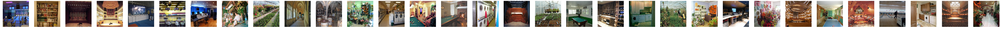

In [17]:
imgs, labels = next(train_batches)
plots(imgs) 

### Cambiamos la ultima capa de AlexNet para 10 clases...

In [2]:
modelAlexNet = generar_AlexNet_original() # tenemos que cambiar la ultima capa de 1000 a 10 clases (bowling, cloister, etc...)
modelAlexNet.pop()
modelAlexNet.add(Dense(10,activation='softmax'))
modelAlexNet.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
__________

In [21]:
# entrenamos el modelo y vemos los resultados
from keras import optimizers

# epochs 
epochs = 120

batch_size = 32 

# tamano dataset test/ batches 
validation_steps = round(201/batch_size)

# tamano dataset train/ batches 
steps_per_epoch = round(799/batch_size)

learning_rate = 0.001

# aqui hay que probar algoritmos de optimizacion.
optimizer = keras.optimizers.SGD(lr=learning_rate, decay=1e-6, momentum=0.9, nesterov=True)
#optimizer = keras.optimizers.Adadelta(lr=learning_rate)
#optimizer = keras.optimizers.RMSprop(lr=learning_rate, rho=0.9, epsilon=None, decay=0.0)
#optimizer = keras.optimizers.Adam(lr=0.00001)

now = time.time()

modelAlexNet.compile(loss= keras.losses.categorical_crossentropy, 
                     optimizer= optimizer, 
                    metrics=['accuracy'])

modelo = modelAlexNet.fit_generator(train_batches, steps_per_epoch=steps_per_epoch, 
                           validation_data = test_batches, 
                           validation_steps =validation_steps,
                          epochs=epochs)

print('tiempo de ejecucion: {}'.format(time.time()-now))

Epoch 1/120
25/25 [==============================] - 9s 375ms/step - loss: 2.5876 - acc: 0.1051 - val_loss: 2.1313 - val_acc: 0.3281
Epoch 2/120
25/25 [==============================] - 7s 295ms/step - loss: 2.1924 - acc: 0.1890 - val_loss: 1.9943 - val_acc: 0.2969
Epoch 3/120
25/25 [==============================] - 8s 301ms/step - loss: 1.9683 - acc: 0.3004 - val_loss: 1.8020 - val_acc: 0.3802
Epoch 4/120
25/25 [==============================] - 7s 299ms/step - loss: 1.8463 - acc: 0.3443 - val_loss: 1.7878 - val_acc: 0.3490
Epoch 5/120
25/25 [==============================] - 7s 299ms/step - loss: 1.7661 - acc: 0.3779 - val_loss: 1.8456 - val_acc: 0.3438
Epoch 6/120
25/25 [==============================] - 7s 296ms/step - loss: 1.6484 - acc: 0.4218 - val_loss: 2.1858 - val_acc: 0.2240
Epoch 7/120
 9/25 [=========>....................] - ETA: 2s - loss: 1.5824 - acc: 0.444425/25 [==============================] - 8s 306ms/step - loss: 1.5429 - acc: 0.4431 - val_loss: 1.9451 - val_acc:

16/25 [==================>...........] - ETA: 1s - loss: 0.0038 - acc: 1.000025/25 [==============================] - 7s 298ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 1.7295 - val_acc: 0.6823
Epoch 64/120
25/25 [==============================] - 7s 296ms/step - loss: 0.0124 - acc: 0.9950 - val_loss: 1.7550 - val_acc: 0.6927
Epoch 65/120
25/25 [==============================] - 8s 302ms/step - loss: 0.0161 - acc: 0.9962 - val_loss: 1.8445 - val_acc: 0.6615
Epoch 66/120
25/25 [==============================] - 7s 294ms/step - loss: 0.0236 - acc: 0.9912 - val_loss: 2.3109 - val_acc: 0.5885
Epoch 67/120
25/25 [==============================] - 8s 303ms/step - loss: 0.0078 - acc: 0.9987 - val_loss: 1.5212 - val_acc: 0.7135
Epoch 68/120
25/25 [==============================] - 7s 298ms/step - loss: 0.0162 - acc: 0.9950 - val_loss: 2.1953 - val_acc: 0.6146
Epoch 69/120
25/25 [==============================] - 8s 303ms/step - loss: 0.0172 - acc: 0.9950 - val_loss: 1.8154 - val_acc: 0.677

14/25 [===============>..............] - ETA: 1s - loss: 9.6684e-04 - acc: 1.000025/25 [==============================] - 7s 298ms/step - loss: 8.1928e-04 - acc: 1.0000 - val_loss: 1.6765 - val_acc: 0.6927
Epoch 120/120
25/25 [==============================] - 8s 303ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 1.7666 - val_acc: 0.6927
tiempo de ejecucion: 900.69074010849


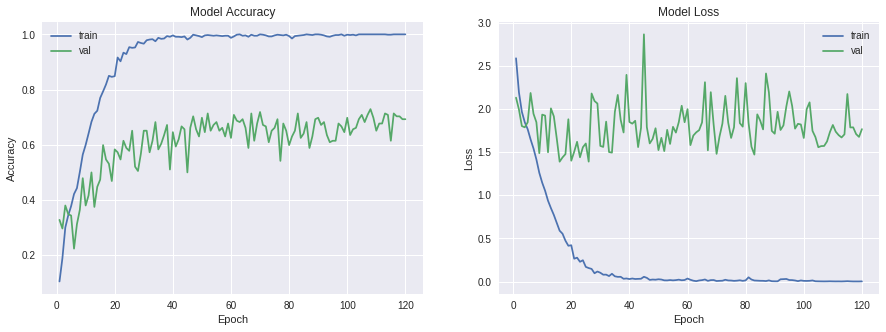

In [23]:
plot_model(modelo)

### Observaciones:
- Se puede observar que como son tan pocos datos de entrenamiento la red AlexNet alcanza una **exactitud de 69% sobre el set de test**, con 120 epochs y batch size de 32 (tiempo de ejecucion 905 segs)  
- Por otra parte, en el set de train la exactitud llega al 100%. 
- No se tienen buenos resultados porque se cuentan con pocas imágenes para realizar el entrenamiento, AlexNet está diseñado para entrenarse con 1.2 millones de imagenes de ImageNet [Alex Krishevsky et al. ImageNet Classification with Deep Convolutional Neural Networks].
- Tiene un accuracy menor a si le entregamos los features a SVM para la clasificación. 
- En este caso AlexNet tiene un peor rendimiento en clasificación en comparación con SVM porque las redes neuronales para alcanzar mejores resultados necesitan ser entrenadas con más datos. 


In [22]:
# test batches en formato sparsed para la prediccion 
batch_size = 201
test_batches = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       seed=1)


#imgs, labels = next(test_batches)
#prediccion = modelAlexNet.predict_classes(imgs)
# CAMBIAR A predict_generator(test_batches)

prediccion = modelAlexNet.predict_generator(test_batches)

## Convertir lista de 1HV a Lista de enteros
labels_prediccion = list(np.argmax(prediccion, axis=-1))

# Reiniciar el generador (con la misma semilla)
test_batches = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       seed=1)

real_i, real_l = convert_generador_to_label_image_list(test_batches, 201)
labels_reales = np.array(real_l) # se ejecuta nuevamente el generador (para tener el mismo orden) y se agrega eltotal de imagenes devuelta por el generador


print(labels_prediccion)
print(real_l)
print("Exactitud", metrics.accuracy_score(labels_prediccion, labels_reales))
print(metrics.classification_report(labels_reales, labels_prediccion, target_names=test_batches.class_indices.keys() ))


Found 201 images belonging to 10 classes.
Found 201 images belonging to 10 classes.
[6, 5, 2, 4, 8, 1, 1, 3, 2, 6, 2, 1, 2, 6, 7, 5, 1, 3, 4, 2, 1, 7, 9, 5, 1, 2, 8, 2, 8, 6, 0, 1, 2, 4, 8, 6, 7, 5, 4, 3, 0, 5, 7, 2, 6, 2, 0, 2, 1, 5, 6, 7, 5, 8, 2, 1, 9, 7, 8, 9, 0, 3, 2, 7, 9, 6, 0, 9, 5, 8, 6, 5, 3, 8, 5, 6, 8, 5, 0, 6, 6, 6, 7, 6, 4, 5, 6, 0, 4, 9, 8, 9, 9, 1, 8, 8, 7, 3, 5, 2, 7, 8, 5, 8, 7, 7, 6, 3, 4, 9, 2, 5, 0, 9, 6, 5, 3, 2, 7, 4, 8, 2, 3, 3, 4, 7, 8, 9, 3, 3, 9, 1, 4, 4, 5, 6, 1, 1, 0, 8, 5, 7, 3, 5, 9, 3, 0, 2, 8, 5, 4, 2, 1, 3, 2, 1, 6, 4, 4, 7, 1, 0, 1, 6, 5, 8, 1, 3, 0, 0, 2, 1, 3, 3, 7, 9, 7, 4, 8, 3, 2, 7, 7, 7, 7, 7, 5, 7, 8, 1, 4, 3, 6, 7, 9, 4, 3, 6, 1, 6, 1]
[4, 5, 2, 1, 8, 7, 1, 3, 0, 0, 8, 1, 8, 0, 7, 5, 1, 9, 4, 9, 1, 7, 0, 5, 1, 2, 8, 2, 8, 4, 9, 1, 2, 4, 8, 6, 4, 6, 4, 3, 9, 5, 6, 2, 0, 2, 0, 2, 1, 5, 6, 9, 3, 8, 2, 1, 9, 7, 8, 9, 9, 3, 4, 7, 2, 0, 0, 9, 5, 2, 3, 5, 2, 8, 5, 6, 8, 5, 0, 6, 4, 6, 7, 6, 4, 5, 6, 0, 4, 9, 8, 2, 9, 1, 8, 9, 7, 5, 5, 9, 7, 8, 3, 1,

# **PARTE 2**

Cuadro comparativo (AlexNet, VGG y ResNet)

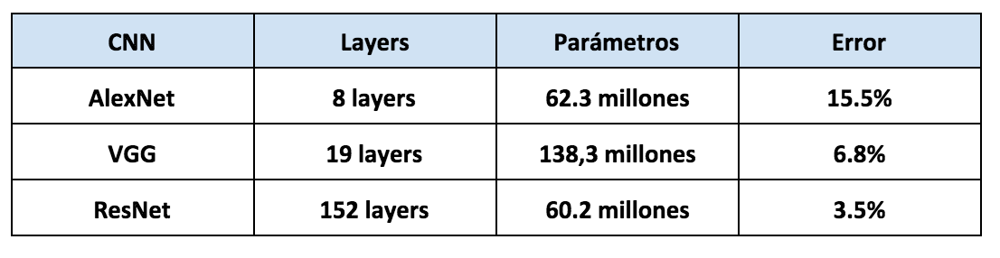

In [5]:
Image("TABLA1.png")

- ResNet es una de las redes convolucionales más nuevas y con mejor rendimiento. Todo parece indicar que mientras más capas es mejor su rendimiento.
- ResNet es una red muy profunda (**152 layers, casi 8 veces más profunda que VGG!**) pero con pocos parámetros en cada una (**total 60.2 millones**), de hecho tiene menos parámetros que AlexNet. 
- VGG superó a AlexNet en su tiempo al incluir más capas y más parámetros, reduciendo del error a menos de la mitad (**de 15.5% a 6.8%**).
- ResNet es una de las redes neuronales convolucionales con mejor rendimiento en la actualidad no solo por la cantidad de capas, sino porque funcionan con deep residual learning.  


### Calibracion de parametros:
Hicimos las siguientes pruebas de los cuales **el que tuvo mejor accuracy fue Alexnet con 120 epochs batchsize de 32 (accuracy 80% validación)**, sin embargo fue tomo mucho tiempo de ejecución (11.5 hrs), a continuación se todos los experimentos con distintos meta parametros: 
- AlexNet con optimizador ADADELTA con **50 epochs y un batch size de 300**
- AlexNet con optimizador ADADELTA con **120 epochs y un batch size de 32**
- AlexNet con optimizador SGD con **120 epochs y un batch size de 32**
- AlexNet con optimizador RMSPROP con **50 epochs y un batch size de 300**
- VGG16 con optimizdor SGD con **25 epochs** y un **batch size de 32** 

#### AlexNet con optimizador ADADELTA con 50 épocas y un batchsize de 300:
**Grafico ** Resultados accuracy (izq) y loss(der) dataset de test en AlexNet 50 epocas, tamaño del batch 300, optimizador ADADELTA, dataset vgg_faces.

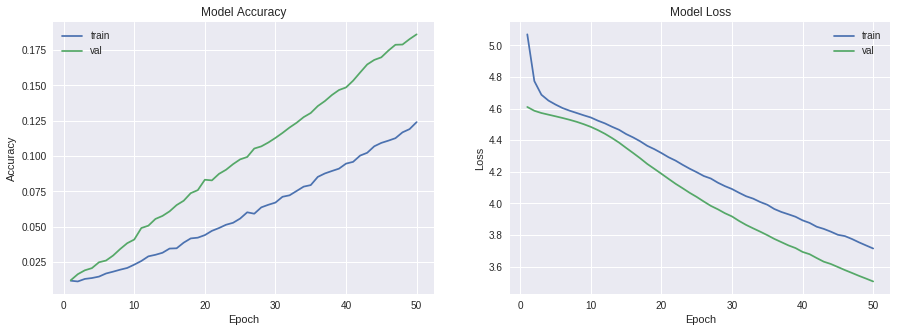

In [10]:
Image("adadelta_alexNet.png")

Con estos meta-parámetros se alcanza **un accuracy en torno al 17.5% con el set de training y de 12.5% con el de validación.** Tuvo un tiempo de ejecución de **8.850 segundos**, lo que indica que no es muy eficiente en su entrenamiento.   

#### AlexNet con optimizador ADADELTA con 120 épocas y un batchsize de 32:
**Grafico ** Resultados accuracy (izq) y loss(der) dataset de test en AlexNet 120 epocas, tamaño del batch 32, optimizador ADADELTA, dataset vgg_faces.

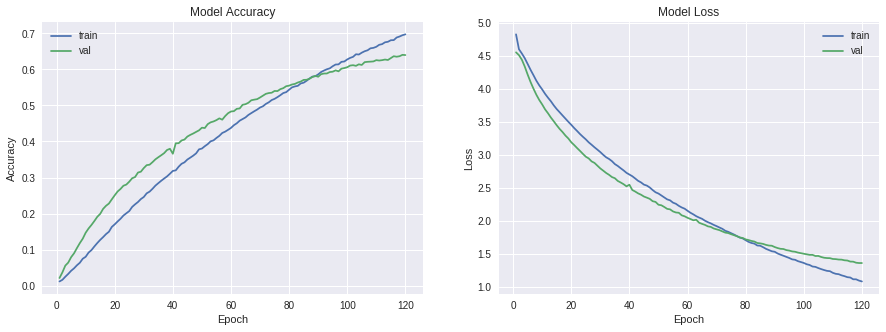

In [12]:
Image("alexnet_adaleta_120epochs.png")

Se puede observar que **AlexNet con un optimizador Adadelta**, **120 épocas y un batchsize de 32 alcanza un accuracy de 70% para set de training y un 62% aprox en el set de validación.** A pesar de utilizar los mismos meta parámetros tiene un peor rendimiento que SGD. Además es más ineficiente porque su tiempo de ejecución fué de **42.219 segundos (11.5 horas). ** 

#### AlexNet con optimizador SGD con 120 épocas y un batchsize de 32:
**Grafico ** Resultados accuracy (izq) y loss(der) dataset de test en AlexNet 120 epocas, tamaño del batch 32, optimizador SGD, dataset vgg_faces.

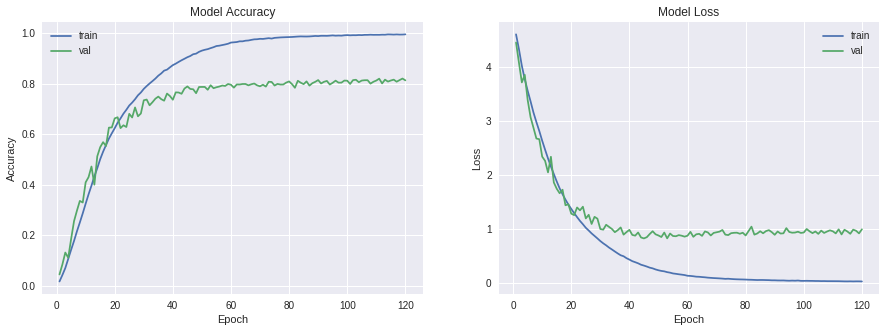

In [13]:
Image("AlexNet_SGD_bsize32_120_epochs.png")

Este modelo con estos meta-parámetros fueron los escogidos para hacer el testing del modelo. **AlexNet con optimizador SGD con 120 épocas y un batchsize de 32 obtuvo** buenos niveles de accuracy, en torno al **100% para el set de training y 81% para el de validación.** Se observa que pérdida disminuye llegando casi a 0 con en set de training y cercana a 1 con el de validación. Su tiempo de ejecución fue de **29.950 segundos (8.3 horas aprox)**, lo que es una debilidad de este modelo por su ineficiencia en el entrenamiento. 

#### AlexNet con optimizador RMSPROP con 15 épocas y un batchsize de 300:
**Grafico ** Resultados accuracy (izq) y loss(der) dataset de test en AlexNet 15 epocas, tamaño del batch 300, optimizador RMSPROP, dataset vgg_faces.

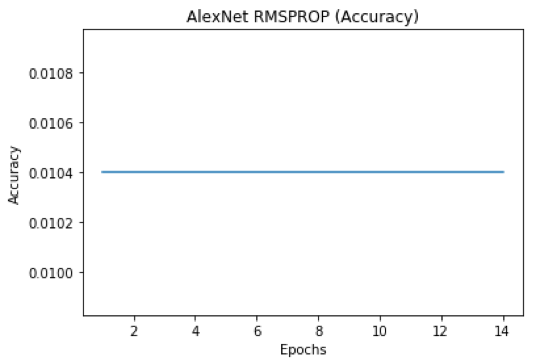

In [14]:
Image("RMSPROP.png")

Se observa que claramente con el optimizador RMSPROP el modelo no aprende y se queda en un **accuracy en torno al 1%.**  En este caso su tiempo de **ejecución fue de 1800 segs** pero al observar que no mejoraba se optó por experimentar con menos epocas. No se hicieron más pruebas con RMSPROP porque independiente de los meta parámetros los resultados no mejoraban. 

### Para hacer los experimentos anteriores se realizo el siguiente procedimiento (se modificaron los metaparametros en cada caso):

In [6]:
# vamos a utilizar VGG faces
!if [ ! -d vggface2_dataset100 ]; then wget 'https://www.dropbox.com/s/yiacgl7jknga963/vggface2_dataset100.zip'; fi
!if [ ! -d vggface2_dataset100 ]; then unzip -q vggface2_dataset100.zip; fi

--2018-04-30 21:01:20--  https://www.dropbox.com/s/yiacgl7jknga963/vggface2_dataset100.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.1, 2620:100:601f:1::a27d:901
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dl.dropboxusercontent.com/content_link/l95cyyz1GH16DdOgHM8YCGvSozxg5EQ4vj0wjQvR5gig8lSHGsZCPM8ucYwHzP56/file [following]
--2018-04-30 21:01:20--  https://dl.dropboxusercontent.com/content_link/l95cyyz1GH16DdOgHM8YCGvSozxg5EQ4vj0wjQvR5gig8lSHGsZCPM8ucYwHzP56/file
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.9.6, 2620:100:601f:6::a27d:906
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.9.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 926156500 (883M) [application/zip]
Saving to: ‘vggface2_dataset100.zip’

vggface2_dataset100 100%[===================>] 883.25M  33.8MB/s    in 27s     


### Aqui importamos los dataset de train, validacion y test en el formato img, label (aqui se modifica el batch size también):

In [7]:
train_path = 'vggface2_dataset100/train'
validation_path = 'vggface2_dataset100/val'
test_path = 'vggface2_dataset100/test'

# image size 
width = 224
height = 224

# batch size  
batch_size = 32

#SI CAMBIA BATCH SIZE RECORDAR PONERLO COMO ARGUMENTO A FLOW FROM DIRECTORY
train_batches_faces = ImageDataGenerator().flow_from_directory(directory=train_path, 
                                                         target_size=(width,height),
                                                        batch_size=batch_size,
                                                              seed=1)

test_batches_faces = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       batch_size = batch_size,
                                                             seed=1)

validation_batches_faces = ImageDataGenerator().flow_from_directory(directory=validation_path, 
                                                         target_size=(width,height),
                                                             batch_size = batch_size,
                                                                   seed=1)

Found 52105 images belonging to 100 classes.
Found 6463 images belonging to 100 classes.
Found 6514 images belonging to 100 classes.


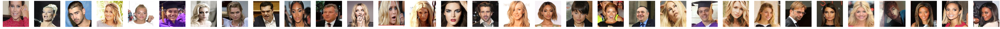

In [42]:
imgs, labels = next(train_batches_faces)
plots(imgs)

### Entrenamos AlexNet y modificamos la ultima capa a 100 clases.


In [4]:
# correr todo 
modelAlexNet2 = generar_AlexNet_original()
modelAlexNet2.pop()

# ultima capa 101 clases, softmax 
modelAlexNet2.add(Dense(100,activation='softmax'))
modelAlexNet2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_11 (ZeroPaddi (None, 228, 228, 3)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 55, 55, 96)        34944     
_________________________________________________________________
activation_11 (Activation)   (None, 55, 55, 96)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 55, 55, 96)        384       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_12 (ZeroPaddi (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 27, 27, 256)       614656    
__________

### En este bloque se modificaron los meta parametros epochs, learning rate y optimizadores:

In [0]:
from keras import optimizers
from keras.callbacks import ModelCheckpoint

# recordar reiniciar la red con los weights aleatorios cuando corramos cada experimento

# ajuste de meta parametros con set de validacion, luego con los que tengamos mejores resultados hacerlo con test. 
# desde 108 epocas no mejora   
epochs = 100

# n_batches es el numero de samples que seran propagadas por la red
# probar con 300
batch_size = 32

#sacado de arriba 
trainsetsize =  52105
validationsetsize = 6514

# aqui se calculan steps per epoch  
steps_per_epoch = round(trainsetsize/batch_size)
validation_steps = round(validationsetsize/batch_size)

learning_rate = 0.001

# aqui hay que probar distintos algoritmos de optimizacion (SGD, Adadelta y RMSPROP)
optimizer = keras.optimizers.SGD(lr=learning_rate)
#optimizer = keras.optimizers.Adadelta(lr=learning_rate)
#optimizer = keras.optimizers.RMSprop(lr=learning_rate, rho=0.9, epsilon=None, decay=0.0) 

# compilamos el modelo 
modelAlexNet2.compile(loss= keras.losses.categorical_crossentropy, 
               optimizer= optimizer, 
              metrics=['accuracy'])
          
print('\nNumero de epochs: {}, \noptimizer: {} \nbatch_size: {}\n'.format(epochs, optimizer, batch_size))

now = time.time()

#checkpoint (guardamos los mejores weigths)
filepath="weights_modelo_final_batch_32_SGD.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

# entrenamos train con validation set para ajuste parametros 
modeloAlexNet_p2 = modelAlexNet2.fit_generator(train_batches_faces, 
                           steps_per_epoch=steps_per_epoch, 
                           validation_data = validation_batches_faces, 
                           validation_steps =validation_steps,
                           epochs=epochs,
                           callbacks=callbacks_list, 
                           use_multiprocessing = True, workers = 5)

print('tiempo de ejecucion: {} segs'.format(time.time() -now))



Numero de epochs: 100, 
optimizer: <keras.optimizers.Adadelta object at 0x7f461fe0de80> 
batch_size: 32

Epoch 1/100
 461/1628 [=======>......................] - ETA: 3:57 - loss: 5.1180 - acc: 0.01071599/1628 [============================>.] - ETA: 5s - loss: 4.8296 - acc: 0.01161628/1628 [==============================] - 344s 211ms/step - loss: 4.8259 - acc: 0.0117 - val_loss: 4.5478 - val_acc: 0.0278

Epoch 00001: val_acc improved from -inf to 0.02779, saving model to weights_modelo_final_batch_32_ADADELTA.best.hdf5
Epoch 2/100
 271/1628 [===>..........................] - ETA: 4:33 - loss: 4.6227 - acc: 0.01651412/1628 [=========================>....] - ETA: 42s - loss: 4.5971 - acc: 0.01691628/1628 [==============================] - 342s 210ms/step - loss: 4.5928 - acc: 0.0173 - val_loss: 4.4970 - val_acc: 0.0450

Epoch 00002: val_acc improved from 0.02779 to 0.04498, saving model to weights_modelo_final_batch_32_ADADELTA.best.hdf5
Epoch 3/100
 227/1628 [===>.....................

 206/1628 [==>...........................] - ETA: 4:48 - loss: 3.4265 - acc: 0.1761366/1628 [========================>.....] - ETA: 51s - loss: 3.4070 - acc: 0.17821628/1628 [==============================] - 342s 210ms/step - loss: 3.4015 - acc: 0.1795 - val_loss: 3.1400 - val_acc: 0.2558

Epoch 00020: val_acc improved from 0.24593 to 0.25576, saving model to weights_modelo_final_batch_32_ADADELTA.best.hdf5
Epoch 21/100
 203/1628 [==>...........................] - ETA: 4:49 - loss: 3.3763 - acc: 0.1771321/1628 [=======================>......] - ETA: 1:00 - loss: 3.3728 - acc: 0.18261628/1628 [==============================] - 341s 210ms/step - loss: 3.3673 - acc: 0.1838 - val_loss: 3.0994 - val_acc: 0.2656

Epoch 00021: val_acc improved from 0.25576 to 0.26558, saving model to weights_modelo_final_batch_32_ADADELTA.best.hdf5
Epoch 22/100
 195/1628 [==>...........................] - ETA: 4:50 - loss: 3.3261 - acc: 0.19001323/1628 [=======================>......] - ETA: 1:00 - loss: 3.3

## VGG16 
**Metaparametros:** 120 epochs, batch size 32 , SGD. <br>
En el siguiente bloque se modifican los metaparametros para VGG:

In [0]:
from keras import optimizers
from keras.callbacks import ModelCheckpoint

# creacion del modelo con output de 100 clases 
modelVGG = VGG16(weights=None,classes = 100)

epochs = 120

batch_size = 32

trainsetsize =  52105
validationsetsize = 6514

steps_per_epoch = round(trainsetsize/batch_size)
validation_steps = round(validationsetsize/batch_size)

learning_rate = 0.001

# aqui hay que probar distintos algoritmos de optimizacion (SGD, Adadelta y RMSPROP)
optimizer = keras.optimizers.SGD(lr=learning_rate)
#optimizer = keras.optimizers.Adadelta(lr=learning_rate)
#optimizer = keras.optimizers.RMSprop(lr=learning_rate, rho=0.9, epsilon=None, decay=0.0) 

# compilamos el modelo 
modelVGG.compile(loss= keras.losses.categorical_crossentropy, 
               optimizer= optimizer, 
              metrics=['accuracy'])
          
print('\nNumero de epochs: {}, \noptimizer: {} \nbatch_size: {}\n'.format(epochs, optimizer, batch_size))

now = time.time()

filepath="weights_modelo_VGG_batch_32_SGD.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

modeloVGG = modelVGG.fit_generator(train_batches_faces, 
                           steps_per_epoch=steps_per_epoch, 
                           validation_data = validation_batches_faces, 
                           validation_steps =validation_steps,
                           epochs=epochs,
                           callbacks=callbacks_list, 
                           use_multiprocessing = True, workers = 5)

print('tiempo de ejecucion: {} segs'.format(time.time() -now))


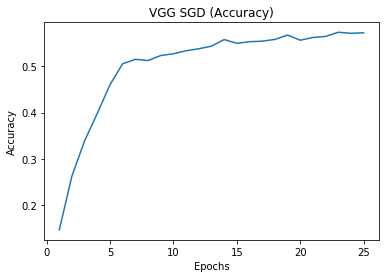

In [4]:
Image('vgg_graph.png')

- VGG con 25 epochs, batch de 32 y optimizador SGD alcanza un nivel de accuracy en torno al **60% para set de training y 99% para el de validación.** 
- Se escogieron 25 epochs porque no se vieron mejoras de accuracy desde la época 22 en adelante. 
- Su tiempo de ejecución fue de **41.400 segundos (aprox 11.5 hrs)** lo que lo hace ser de los experimentos probados el menos eficiente, ya que se ejecutaron tan solo 25 epochs.

Modelo seleccionado AlexNet con metaparámetros escogidos (**SGD, 120 epochs y batchsize de 32**):

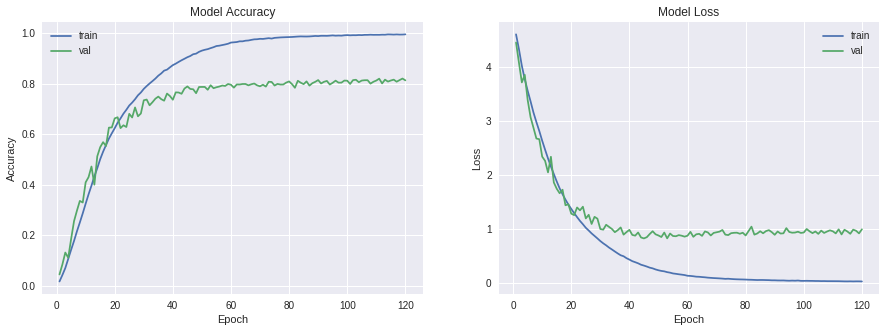

In [0]:
plot_model(modeloAlexNet_p2)

- Como se mencionó anteriormente los niveles de accuracy alcanzan un nivel cercano al **100% para el dataset de train y al 80% en el de validación.** 
- Con el dataset de validación se alcanza el **mayor accuracy a partir de la época 40** , en cambio para el **training se alcanza este rendimiento a partir de la época 60.** 
- Respecto de la función de pérdida en el gráfico izquierdo el de validación tiene los **menores niveles de pérdida desde la época 40 en adelante y queda en torno a 1.** 
- Por parte del dataset de train su menor nivel de pérdida está en la última época. La forma de la curva de entrenamiento es más "flow" que la de la validación. 
- La gran debilidad de este modelo es su eficiencia, pues demoró **29.950 segundos (8.3 horas aprox) en su entrenamiento. **




- Finalmente, con los meta-parámetros que tuvieron el mejor rendimiento en el modelo de AlexNet hacer las pruebas si el modelo está prediciendo bien utilizando datos del set de testing, obteniendo los siguientes resultados: 
- Se obtuvo un **accuracy de predicción del 0.81 y 0.9 pérdida.** (detalles abajo)
- Las clases con mejor prediccion se detallan mas abajo


### Predicciones:

In [10]:
nombre_archivo_model = 'weights_modelo_VGG_batch_32_SGD.best.hdf5'
# ESTO ES PARA GUARDAR EN DRIVE EL ARCHIVO LLAMADO weights_modelo_final.best.hdf5
#---------------------------------------------------------------------------------

# Install the PyDrive wrapper & import libraries.
# This only needs to be done once in a notebook.
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once in a notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Create & upload a file.
uploaded = drive.CreateFile({'title': nombre_archivo_model})
uploaded.SetContentFile(nombre_archivo_model)
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))

Uploaded file with ID 19V2d6jUSB8gCt1dIoPQXbJ3ATTQ4OKKl


In [0]:
# obtenemos los pesos
!wget 'https://www.dropbox.com/s/jkeanpz28ygmap4/weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5?dl=0'

In [0]:
# predicciones 
modelAlexNet2.load_weights('weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5?dl=0')

### Predecir con ALEXNET con el modelo generado (o descargado) sobre test set

In [2]:
from keras import backend as K
import scipy.io as sio
from keras import Sequential
from keras.layers.core import Dense, Activation, Dropout,Flatten
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D, Convolution2D, BatchNormalization
import keras
from keras import optimizers
from google.colab import files
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import os
import matplotlib.pyplot as plt 
%matplotlib inline
import numpy as np
import time
keras.backend.tensorflow_backend._get_available_gpus()

def my_init(shape, dtype=None):
    return K.random_normal(shape, dtype=dtype)


modelAlexNet = generar_AlexNet_original()
# tenemos que cambiar la ultima capa de 1000 a 10 clases (bowling, cloister, etc...)
modelAlexNet.pop()
modelAlexNet.add(Dense(100,activation='softmax'))
#modelAlexNet.summary()

# n_batches es el numero de samples que seran propagadas por la red.
#n_batches = 1
batch_size=32

learning_rate = 0.01

# La funcion de optimización escogida, gradiente descendente estocástica
optimizer = keras.optimizers.SGD(lr=0.01)

################### DESCARGA DEL SET DE DATOS Y EL MODELO GENERADO #########################
!if [ ! -d vggface2_dataset100 ]; then wget 'https://www.dropbox.com/s/jkeanpz28ygmap4/weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5'; fi #modelo
!if [ ! -d vggface2_dataset100 ]; then wget 'https://www.dropbox.com/s/yiacgl7jknga963/vggface2_dataset100.zip'; fi
!if [ ! -d vggface2_dataset100 ]; then unzip -q vggface2_dataset100.zip; fi

# Cargar el modelo guardado
modelAlexNet.load_weights("weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5")
# Compilar el modelo para armar predicciones
modelAlexNet.compile(loss=keras.losses.categorical_crossentropy, 
                     optimizer= optimizer, 
                    metrics=['accuracy'])
print("Modelo creado con los pesos del archivo HDF5")


# PARA GENERAR BATCHES DEL TOTAL DE IMAGENES
train_path = 'vggface2_dataset100/train'
validation_path = 'vggface2_dataset100/val'
test_path = 'vggface2_dataset100/test'

# aqui sacamos los nombres de las clases (de las carpetas)
classes = os.listdir('vggface2_dataset100/test')
classes.remove('.directory')


# image size 
width = 224
height = 224

# batch size 32 
bs_train = 32
bs_test = 32
bs_val = 32
  
train_batches_faces_2 = ImageDataGenerator().flow_from_directory(directory=train_path, 
                                                         target_size=(width,height),
                                                        batch_size=batch_size,
                                                                 shuffle=False,
                                                                seed=1)

test_batches_faces_2 = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       batch_size = batch_size,
                                                                shuffle=False,
                                                               seed=1)

validation_batches_faces_2 = ImageDataGenerator().flow_from_directory(directory=validation_path, 
                                                         target_size=(width,height),
                                                             batch_size = batch_size,
                                                                      shuffle=False,
                                                                     seed=1)

## Evaluacion del modelo
evaluacion_test = modelAlexNet.evaluate_generator(test_batches_faces_2)
print("*** La clasificación sobre el set de TEST tiene un loss de",evaluacion_test[0],"y una exactitud de",evaluacion_test[1]*100,"%")

evaluacion_train = modelAlexNet.evaluate_generator(train_batches_faces_2)
print("*** La clasificación sobre el set de TRAIN tiene un loss de",evaluacion_train[0],"y una exactitud de",evaluacion_train[1]*100,"%")

evaluacion_val = modelAlexNet.evaluate_generator(validation_batches_faces_2)
print("*** La clasificación sobre el set de VALIDACION tiene un loss de",evaluacion_val[0],"y una exactitud de",evaluacion_val[1]*100,"%")



## Generar Predicciones sobre el set de test
test_batches_faces_2 = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       batch_size = batch_size,
                                                               seed=1,shuffle=False)
prediccion = modelAlexNet.predict_generator(test_batches_faces_2)



## Convertir lista de 1HV a Lista de enteros
labels_predict = np.argmax(prediccion, axis=-1)

# Reiniciar el generador (con la misma semilla)
test_batches_faces_2 = ImageDataGenerator().flow_from_directory(directory=test_path, 
                                                         target_size=(width,height),
                                                       batch_size = batch_size,
                                                               seed=1,shuffle=False)
real_i, real_l = convert_generador_to_label_image_list(test_batches_faces_2, 6463)
labels_reales = np.array(real_l) # se ejecuta nuevamente el generador (para tener el mismo orden) y se agrega eltotal de imagenes devuelta por el generador

#print("Cantidad de Reales:",labels_reales.shape)
#print("Cantidad de Predic:",labels_predict.shape)

print("\n****************** La lista de clasificaciones sobre el set de test es la siguiente:")
print("Real:",list(labels_reales))
print("Pred:",list(labels_predict))

print("\n****************** El reporte de Clasificación, con precisión, recall, f1 score y total de muestras sobre test es el siguiente:")
accuracy = metrics.accuracy_score(labels_predict, labels_reales)
#print ("La clasificacion tiene {}% de exactitud sobre el set de test". format(accuracy*100))

print(metrics.classification_report(labels_reales, labels_predict, target_names=test_batches_faces_2.class_indices.keys()))
conf_mat = metrics.confusion_matrix(labels_reales, labels_predict)

 
  
  

--2018-05-04 19:33:17--  https://www.dropbox.com/s/jkeanpz28ygmap4/weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.1, 2620:100:601f:1::a27d:901
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dl.dropboxusercontent.com/content_link/bAX6kslywCBO7Fr9QxsxPGoSgcAAsFmY2dBR5Y4ZAuHs7nqjDAybFxsLoDOcyEP7/file [following]
--2018-05-04 19:33:18--  https://dl.dropboxusercontent.com/content_link/bAX6kslywCBO7Fr9QxsxPGoSgcAAsFmY2dBR5Y4ZAuHs7nqjDAybFxsLoDOcyEP7/file
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.9.6, 2620:100:6022:6::a27d:4206
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.9.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 469606248 (448M) [text/plain]
Saving to: ‘weights_modelo_final_batch_32_SGD.best.FINAL100.hdf5’

weights_modelo_fina 100%

**Se puede observar lo siguiente: **

* Sobre el set de **Train**, la clasificación tiene una exactitud de **100%**
* Sobre el set de **Validación**, la clasificación tiene una exactitud de **81.96%**
* Sobre el set de **Test**, la clasificación tiene una exactitud de **81.75%**


** En la siguiente tabla, se puede observar la exactitud por cada clase **



In [8]:
 # se instaló en el init
accuracy_per_class = conf_mat.diagonal()/conf_mat.sum(axis=1)

t = PrettyTable(['No', 'Clase', 'Accuracy'])

cont=0
for acp in accuracy_per_class:
  t.add_row([cont, (list(test_batches_faces_2.class_indices.keys())[list(test_batches_faces_2.class_indices.values()).index(cont)]), round(acp*100,2) ])
  cont = cont + 1
t.sortby = "Accuracy"

print("El accuracy por cada clase (recall), de menor a mayor")
print(t)

El accuracy por cada clase (recall), de menor a mayor
+----+-------------------------+----------+
| No |          Clase          | Accuracy |
+----+-------------------------+----------+
| 26 |     Claudia_Schiffer    |   62.9   |
| 12 |      Ashlee_Simpson     |  63.49   |
| 35 |         Eunhyuk         |  63.77   |
| 61 |       Kim_Ryeowook      |  65.43   |
| 72 |      Lily_Donaldson     |  66.13   |
| 99 |         Zendaya         |  67.21   |
| 64 |      Kirsten_Dunst      |  67.69   |
| 75 |    Malaika_Arora_Khan   |  67.69   |
| 29 |       Cole_Sprouse      |  68.66   |
| 47 |  Jimi_Blue_Ochsenknecht |  68.75   |
| 56 |       Karlie_Kloss      |  69.12   |
| 14 |      Ashley_Tisdale     |  69.23   |
| 59 |       Kate_Hudson       |  70.49   |
| 21 |       Cheryl_Cole       |  71.43   |
| 45 |       Jessica_Hart      |  72.31   |
| 20 |       Chanel_Iman       |  72.73   |
| 68 |      Lauren_Conrad      |  73.13   |
| 91 |      Sienna_Miller      |  73.13   |
| 16 |      Brittany_S

### Clases con peor rendimiento
** De acuerdo a la tabla con la exactitud por cada clase, se puede observar lo siguiente **
*   Las clases con peor exactitud son Claudia_Schiffer (62.9%), Ashlee_Simpson (63.49%), Eunhyuk (63.67%)
* A continuación se muestran unas imagenes mal clasificadas de estas clases, su correspondiente predicción y un ranking con las 5 primeras probabilidades de clases.


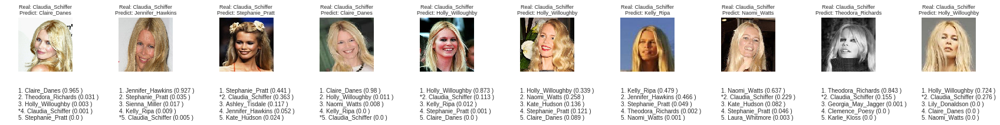

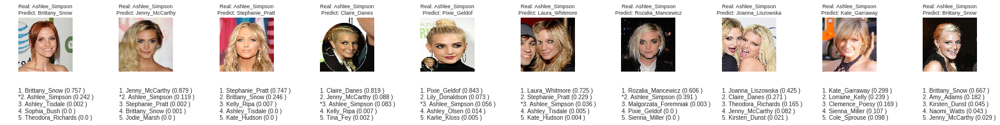

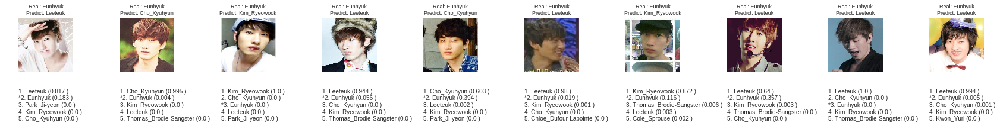

In [3]:
Mostrar10ClasificacionesMalasProbabilidad(26) #Claudia_Schiffer
Mostrar10ClasificacionesMalasProbabilidad(12) #Ashley Simpson
Mostrar10ClasificacionesMalasProbabilidad(35) #Eunhyuk 

Las imágenes mal clasificadas de Claudia Shiffer fueron clasificadas *Claire Danes, Jennifer Hawkins, Stephanie Pratt, Holly Whilloughby, Kelly Ripa, Naomi Watts y Theodora Richards*. Todas ellas tienen rasgos y caracteristicas facilaes similares a Claudia Shiffer (Blancas, rubias y de ojos azules) como se muestra en las siguientes comparaciones con imagenes de Claudia Shiffer extraidas del set de test e imagenes de las anteriormente nombradas del set de Train. 

Como se puede observar, la clase correspondiente a la imagen (clase real) en general se encuentra dentro de las cinco primeras con una probabilidad del mismo orden de magitud que la clase predicha, y en las siguientes su probabilidad se reduce en a lo menos un orden de magnitud.

En los tres casos, en terminos generales, dentro del ranking predominan clases con alta similitud a la clase real. En el caso de Claudia_Schiffer y Ashley_Simpson las clases existentes dentro del ranking corresponden a mujeres blancas y rubias. En el caso de Eunhyuk las clases con mayor probabilidad corresponden a Asiaticos, existiendo excepciones.

Claudia Shiffer y Claire Danes


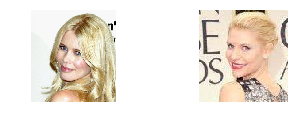

Claudia Shiffer y Jennifer Hawkins


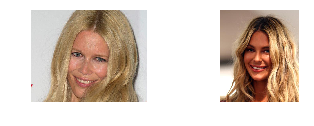

Claudia Shiffer y Holly Willoughby


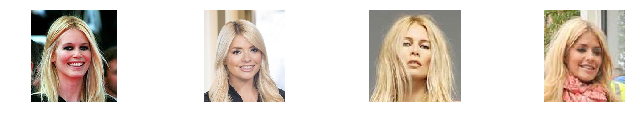

In [145]:
#@title
print("Claudia Shiffer y Claire Danes")
f = plt.figure(figsize=(30,30))
sp = f.add_subplot(15,10,1)
a= sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/test/Claudia_Schiffer/0037_01.jpg'))

sp = f.add_subplot(15,10,2)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Claire_Danes/0537_01.jpg'))

plt.show()

print("Claudia Shiffer y Jennifer Hawkins")
f = plt.figure(figsize=(30,30))
sp = f.add_subplot(15,10,1)
a= sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/test/Claudia_Schiffer/0064_01.jpg'))

sp = f.add_subplot(15,10,2)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Jennifer_Hawkins/0074_01.jpg'))

plt.show()



print("Claudia Shiffer y Holly Willoughby")
f = plt.figure(figsize=(30,30))
sp = f.add_subplot(15,10,1)
a= sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/test/Claudia_Schiffer/0160_01.jpg'))

sp = f.add_subplot(15,10,2)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Holly_Willoughby/0080_01.jpg')) 

sp = f.add_subplot(15,10,3)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/test/Claudia_Schiffer/0248_01.jpg'))

sp = f.add_subplot(15,10,4)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Holly_Willoughby/0387_01.jpg'))

plt.show()


**El tercero con peor exactitud en la clasificación es Eunhyuk. Este tambien comparte características similares a Leeteuk y Cho_Kyuhyun, asiaticos con corte de cabello similar.**

Eunhyuk, Leeteuk, Cho_Kyuhyun y Kim_Ryeowook 


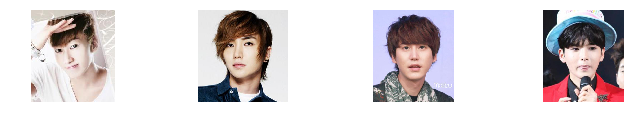

In [151]:
#@title
print("Eunhyuk, Leeteuk, Cho_Kyuhyun y Kim_Ryeowook ")
f = plt.figure(figsize=(30,30))
sp = f.add_subplot(15,10,1)
a= sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/test/Eunhyuk/0027_02.jpg'))

sp = f.add_subplot(15,10,2)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Leeteuk/0032_01.jpg'))

sp = f.add_subplot(15,10,3)
a = sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Cho_Kyuhyun/0117_01.jpg'))

sp = f.add_subplot(15,10,4)
a= sp.axis('Off')
plt.imshow(matplotlib.image.imread('vggface2_dataset100/train/Kim_Ryeowook/0079_01.jpg'))
 
plt.show()

  

### Clases con mejor rendimiento
* El mejor rendimiento en el set de test se da en Krysten_Ritter, Christine_Lagarde, Jenny_McCarthy y Alfredo_Perez_Rubalcaba
* A continuación se muestran ejemplos con correcta clasificación en estas clases.

Imágenes bien clasificadas de las clases con mejor rendimiento


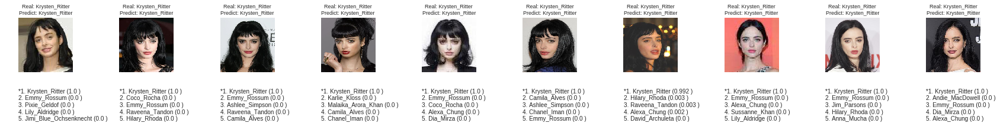

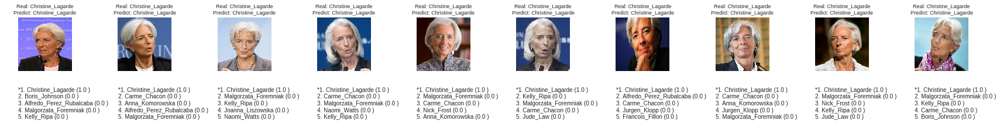

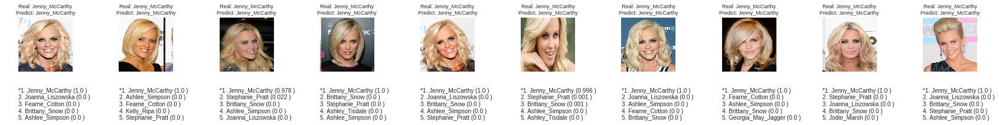

In [7]:
print("Imágenes bien clasificadas de las clases con mejor rendimiento")
Mostrar10ClasificacionesBuenasProbabilidad(65)  # Krysten_Ritter
Mostrar10ClasificacionesBuenasProbabilidad(24)  # Christine_Lagarde 
Mostrar10ClasificacionesBuenasProbabilidad(44)  # Jenny_McCarthy 

Dentro de las imágenes bien clasificadas, se puede observar que en general la probabilidad de la clase predicha en la clasificación es cercana a 1. Es decir, el modelo clasifica con mucha seguridad elementos correspondientes a esas clases.

A continuación se muestran las imagenes **mal clasificadas** de las clases con **mejor rendimiento**
* En la única imagen mal clasificada de Krysten Ritter, esta fue clasificada como Hilary_Rhoda, y en esa imagen está dividida en dos y se ven ambas. 
* En el caso de la imagen mal clasificada de Christine_Lagarde, esta fue clasificada como Carme_Chacon, que es una persona mas joven pero con un gran parecido
* En el caso de Jenny_McCarthy, los tres errores que cometió fueron con Stephanie Pratt y Brittany_Snow, ambas blancas y rubias.

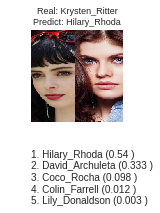

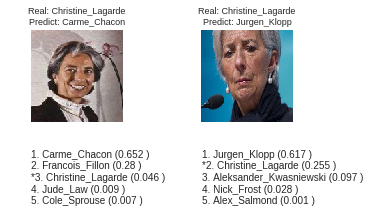

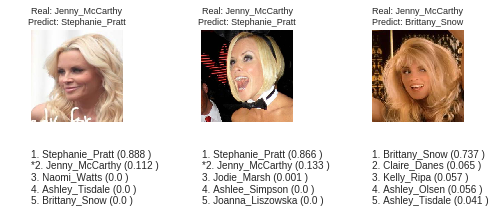

In [4]:
Mostrar10ClasificacionesMalasProbabilidad(65)  # Krysten_Ritter
Mostrar10ClasificacionesMalasProbabilidad(24)  # Christine_Lagarde 
Mostrar10ClasificacionesMalasProbabilidad(44)  # Jenny_McCarthy 

### Algunas curiosidades del dataset y la clasificación 
* En el set de test de la clase Alberto_Nunez_Feijoo existian imágenes mal clasificadas de Mariano Rajoy y una mujer, ambos no individualizados como clases, pero si en el set de entrenamiento existian aproximidamente 5 fotos de Rajoy y 2 de la mujer, sin embargo el modelo no fue capaz de clasificarlas como parte de la clase.
* En el caso de la mujer, el modelo entre el ranking de las 5 primeras probabilidades, solo mostró mujeres.


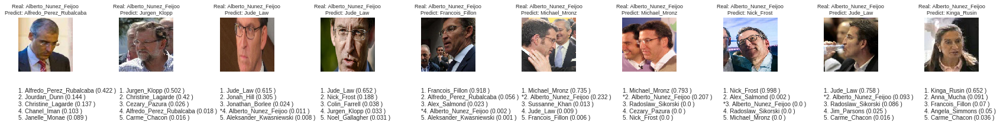

In [5]:
Mostrar10ClasificacionesMalas(0)  #Alberto_Nunez_Feijoo

# Conclusiones
* Los errores en la clasificación caen en errores similares a los que caería un humano. Como se observó en los casos de Claudia Shiffer y Eunhyuk, existian fotos con caracteristicas similares dentro del set de train de las clases con las que fueron confundidas. Respecto a la probabilidad con la que fue clasificada, se podría decir que el sistema no tuvo seguridad en dichas clasificaciones, lo que marca una gran diferencia con las clases bien clasificadas.
* Como se vió en la última sección, incluir una pequeña cantidad de imagenes dentro de un set no permite que se logre una correcta clasificación de estas imagenes, como en el caso de Mariano Rajoy y la mujer incluida en el set de Alberto Nuñez Feijoo.